In [44]:
# Data Manipulation
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

# Data Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Pipeline and Column Transformers
from sklearn.utils import shuffle
from sklearn.pipeline import Pipeline,make_pipeline
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn import set_config
set_config(display = "diagram")

# Scaling
from sklearn.preprocessing import RobustScaler, StandardScaler, MinMaxScaler

# Cross Validation
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_predict

# Unsupervised Learning
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans 

# STATISTICS
from statsmodels.graphics.gofplots import qqplot
# This function plots your sample against a Normal distribution, 
# to see whether your sample is normally distributed or not

# import dataset


In [2]:
spotify = pd.read_csv('https://wagon-public-datasets.s3.amazonaws.com/Machine%20Learning%20Datasets/ML_spotify_data.csv')
spotify.head()

,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo
0,We're For The Dark - Remastered 2010,['Badfinger'],22,0.678,0.559,0.432,0,3,0.0727,-12.696,0.0334,117.674
1,Sixty Years On - Piano Demo,['Elton John'],25,0.456,0.259,0.368,0,6,0.1560,-10.692,0.0280,143.783
2,Got to Find Another Way,['The Guess Who'],21,0.433,0.833,0.724,0,0,0.1700,-9.803,0.0378,84.341
3,Feelin' Alright - Live At The Fillmore East/1970,['Joe Cocker'],22,0.436,0.870,0.914,0,5,0.8550,-6.955,0.0610,174.005
4,Caravan - Take 7,['Van Morrison'],23,0.669,0.564,0.412,0,7,0.4010,-13.095,0.0679,78.716


In [3]:
# shuffle the dataset
spotify = shuffle(spotify)
spotify.head()

,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo
8517,Stone,['Alice In Chains'],49,0.456,0.558,0.867,0,1,0.0914,-4.499,0.0399,75.991
7355,Sin Tu Amor,"['Nigga', 'Alex Pro']",60,0.693,0.941,0.609,0,6,0.3260,-5.514,0.0469,170.791
4513,Do You Really Want To Hurt Me,['Culture Club'],38,0.742,0.433,0.399,0,4,0.3210,-13.070,0.0359,100.460
6005,No Mercy,['Immortal Technique'],39,0.738,0.311,0.684,1,4,0.5340,-8.527,0.3880,81.296
3280,Contrabando Y Robo,['Los Tigres Del Norte'],30,0.850,0.812,0.427,0,9,0.2140,-9.478,0.1560,112.412


In [4]:
spotify.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 8517 to 4916
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   name          10000 non-null  object 
 1   artists       10000 non-null  object 
 2   popularity    10000 non-null  int64  
 3   danceability  10000 non-null  float64
 4   valence       10000 non-null  float64
 5   energy        10000 non-null  float64
 6   explicit      10000 non-null  int64  
 7   key           10000 non-null  int64  
 8   liveness      10000 non-null  float64
 9   loudness      10000 non-null  float64
 10  speechiness   10000 non-null  float64
 11  tempo         10000 non-null  float64
dtypes: float64(7), int64(3), object(2)
memory usage: 1015.6+ KB


In [5]:
spotify.describe()

,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000
mean,37.556800,0.549507,0.523148,0.592609,0.103200,5.20560,0.209787,-9.822324,0.081426,120.179723
std,12.559743,0.178097,0.261456,0.251808,0.304235,3.56205,0.193693,5.321064,0.100472,30.260748
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,-60.000000,0.000000,0.000000
25%,27.000000,0.430000,0.313000,0.414000,0.000000,2.00000,0.093900,-12.347250,0.034200,96.191250
50%,36.000000,0.557000,0.524500,0.616000,0.000000,5.00000,0.129000,-8.762000,0.045100,118.330500
75%,46.000000,0.681000,0.742000,0.801000,0.000000,9.00000,0.261250,-6.070750,0.077400,139.609500
max,86.000000,0.986000,0.996000,1.000000,1.000000,11.00000,1.000000,1.073000,0.957000,224.437000


# feature engineering

In [6]:
# numerical features
num_feature = spotify.select_dtypes(exclude = ['object'])
num_feature

,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo
8517,49,0.456,0.558,0.867,0,1,0.0914,-4.499,0.0399,75.991
7355,60,0.693,0.941,0.609,0,6,0.3260,-5.514,0.0469,170.791
4513,38,0.742,0.433,0.399,0,4,0.3210,-13.070,0.0359,100.460
6005,39,0.738,0.311,0.684,1,4,0.5340,-8.527,0.3880,81.296
3280,30,0.850,0.812,0.427,0,9,0.2140,-9.478,0.1560,112.412
...,...,...,...,...,...,...,...,...,...,...
3161,25,0.635,0.538,0.514,0,0,0.0821,-9.382,0.0344,118.865
7031,39,0.703,0.449,0.568,0,6,0.3030,-9.794,0.0394,124.946
1904,24,0.531,0.876,0.746,0,4,0.1260,-11.305,0.0446,129.280
2368,26,0.775,0.889,0.630,0,5,0.1380,-6.938,0.0503,75.122


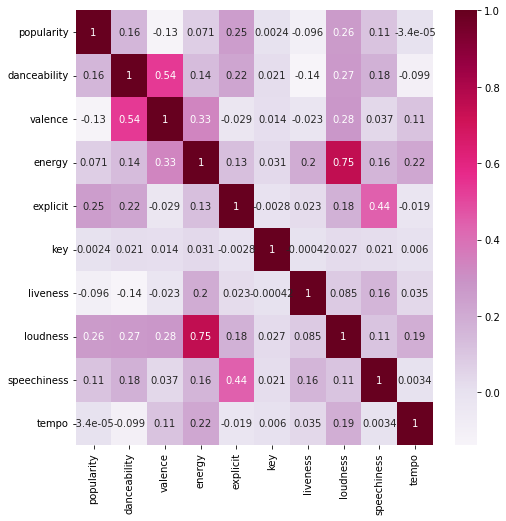

In [7]:
plt.figure(figsize=(8,8))

sns.heatmap(num_feature.corr(),
            annot = True,
            annot_kws = {"fontsize":10},
            cmap='PuRd');

In [11]:
fig = px.scatter_3d(num_feature, 
                    x = 'tempo',
                    y = 'energy',
                    z = 'popularity',
                    opacity=0.7, width=500, height=500
           )
fig.show()

# KMeans Clustering

## Vanilla KMeans

In [12]:
vanilla = KMeans(n_clusters=8)
vanilla.fit(num_feature)

KMeans()

In [13]:
vanilla_labels = vanilla.labels_
vanilla_labels

array([5, 7, 1, ..., 6, 4, 5], dtype=int32)

In [15]:
fig = px.scatter_3d(num_feature, 
                    x = 'tempo',
                    y = 'energy',
                    z = 'popularity',
                    color = vanilla_labels, width=500, height=500
           )
fig.show()

## feature sclaing and KMeans

In [16]:
scaler = RobustScaler()
scaled_feature = pd.DataFrame(scaler.fit_transform(num_feature),columns = num_feature.columns)
scaled_feature

,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo
0,0.684211,-0.402390,0.078089,0.648579,0.0,-0.571429,-0.224679,0.679200,-0.120370,-0.975154
1,1.263158,0.541833,0.970862,-0.018088,0.0,0.142857,1.177174,0.517486,0.041667,1.208259
2,0.105263,0.737052,-0.213287,-0.560724,0.0,-0.142857,1.147296,-0.686370,-0.212963,-0.411590
3,0.157895,0.721116,-0.497669,0.175711,1.0,-0.142857,2.420078,0.037441,7.937500,-0.852971
4,-0.315789,1.167331,0.670163,-0.488372,0.0,0.571429,0.507918,-0.114076,2.567130,-0.136314
...,...,...,...,...,...,...,...,...,...,...
9995,-0.578947,0.310757,0.031469,-0.263566,0.0,-0.714286,-0.280251,-0.098781,-0.247685,0.012310
9996,0.157895,0.581673,-0.175991,-0.124031,0.0,0.142857,1.039737,-0.164423,-0.131944,0.152367
9997,-0.631579,-0.103586,0.819347,0.335917,0.0,-0.142857,-0.017927,-0.405162,-0.011574,0.252187
9998,-0.526316,0.868526,0.849650,0.036176,0.0,0.000000,0.053780,0.290608,0.120370,-0.995169


In [17]:
scaled_model = KMeans(n_clusters=8)
scaled_model.fit(scaled_feature)

KMeans()

In [18]:
scaled_label = scaled_model.labels_

In [25]:
fig = px.scatter_3d(scaled_feature, 
                    x = 'tempo',
                    y = 'energy',
                    z = 'popularity',
                    color = scaled_label, width=500, height=500
           )
fig.show()

## PCA 

In [21]:
pca = PCA(n_components=3,whiten=True)
data_projected = pd.DataFrame(pca.fit_transform(num_feature))
data_projected

,0,1,2
0,1.452314,0.969618,-1.023671
1,-1.676047,1.782071,0.070417
2,0.654618,0.009235,0.530483
3,1.281987,0.143030,-0.475391
4,0.256111,-0.585097,-0.347495
...,...,...,...
9995,0.043350,-0.979374,-0.383590
9996,-0.157406,0.111448,0.058626
9997,-0.298341,-1.081600,0.008130
9998,1.484265,-0.857174,-1.178637


In [22]:
fig_scaled = px.scatter_3d(data_projected, x = 0, y = 1, z = 2, opacity=0.7, width=500, height=500)
fig_scaled.show()

In [23]:
pca_model = KMeans(n_clusters=8)
pca_model.fit(data_projected)

KMeans()

In [24]:
pca_label = pca_model.labels_
pca_label

array([7, 6, 5, ..., 4, 0, 7], dtype=int32)

In [28]:
fig_scaled = px.scatter_3d(data_projected,
                           x = 0,
                           y = 1,
                           z = 2,
                           color = pca_label,
                           width=500, height=500)
fig_scaled.show()

## Ideal n_cluster

In [30]:
n_cluster_range = np.arange(1,21,1)
n_cluster_range

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20])

Compare each model's inertia:
    
= sum of squared distances of each observations to their closest centroids  
= sum of within-cluster sum of squares (WCSS)


In [32]:
wcss = []

for K in n_cluster_range:
    print('working with ' + str(K) + ' clusters...', flush=True)
    kmeans = KMeans(n_clusters = K)
    kmeans.fit(data_projected)
    wcss.append(kmeans.inertia_)
print("DONE !")

working with 1 clusters...
working with 2 clusters...
working with 3 clusters...
working with 4 clusters...
working with 5 clusters...
working with 6 clusters...
working with 7 clusters...
working with 8 clusters...
working with 9 clusters...
working with 10 clusters...
working with 11 clusters...
working with 12 clusters...
working with 13 clusters...
working with 14 clusters...
working with 15 clusters...
working with 16 clusters...
working with 17 clusters...
working with 18 clusters...
working with 19 clusters...
working with 20 clusters...
DONE !


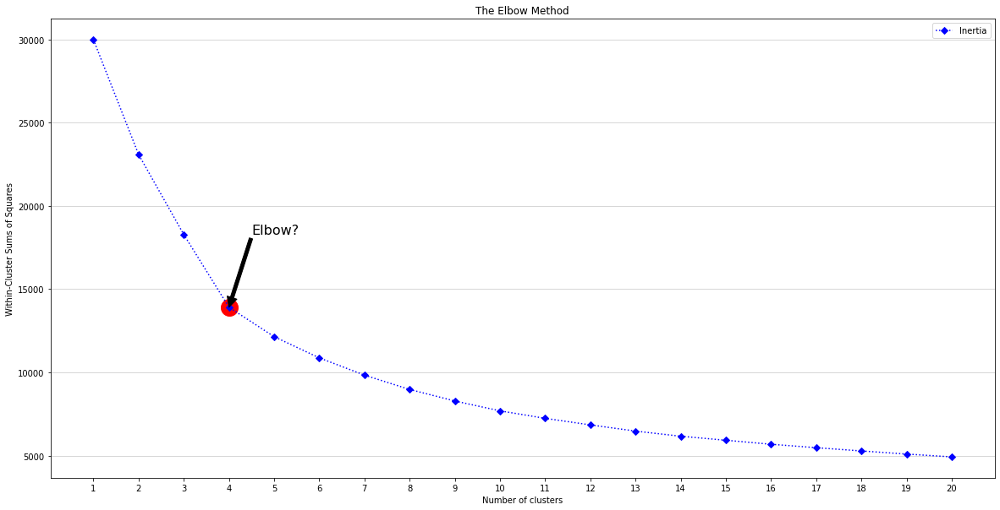

In [34]:
elbow_highlight = 4
with plt.style.context('seaborn-deep'):
    # figsize
    plt.figure(figsize=(20,10))
    # getting axes
    ax = plt.gca()
    # plotting
    ax.plot(n_cluster_range, wcss,color="blue",linestyle=":",marker="D",label="Inertia")
    # customizing
    ax.legend(loc="upper right")
    ax.set_title('The Elbow Method')
    ax.set_xticks(n_cluster_range)
    ax.set_xlabel('Number of clusters')
    ax.set_ylabel('Within-Cluster Sums of Squares')
    ax.scatter(elbow_highlight,wcss[elbow_highlight-1],c='red',s=400)    
    # annotate
    ax.annotate("Elbow?", 
                (elbow_highlight,wcss[elbow_highlight-1]),
                (elbow_highlight+0.50,wcss[elbow_highlight-1]+5000), 
                arrowprops=dict(facecolor='black'),
                fontsize=16,
#                horizontalalignment='middle', 
                verticalalignment='top')
    
    ax.grid(axis="y",linewidth=0.5)
    plt.show()

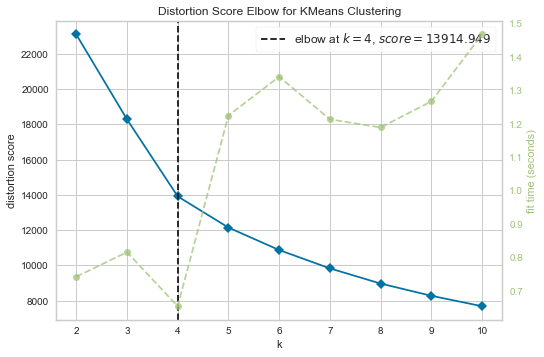

In [36]:
from yellowbrick.cluster import KElbowVisualizer
kmeans = KMeans()
elbow_visualizer = KElbowVisualizer(kmeans, n_clusters = (1,21))
elbow_visualizer.fit(data_projected)
elbow_visualizer.show();

In [37]:
best_cluster = 4

## ultimate KMeans

In [38]:
kmeans = KMeans(n_clusters = best_cluster, max_iter = 300)
kmeans.fit(data_projected)
label = kmeans.labels_

fig_scaled = px.scatter_3d(data_projected,
                           x = 0,
                           y = 1,
                           z = 2,
                           color=label, width=500, height=500)
fig_scaled.show()

In [39]:
spotify_labelled = pd.concat([spotify,pd.Series(label)],axis=1).rename(columns={0:"label"})
spotify_labelled

,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
0,We're For The Dark - Remastered 2010,['Badfinger'],22,0.678,0.559,0.432,0,3,0.0727,-12.696,0.0334,117.674,2
1,Sixty Years On - Piano Demo,['Elton John'],25,0.456,0.259,0.368,0,6,0.1560,-10.692,0.0280,143.783,2
2,Got to Find Another Way,['The Guess Who'],21,0.433,0.833,0.724,0,0,0.1700,-9.803,0.0378,84.341,3
3,Feelin' Alright - Live At The Fillmore East/1970,['Joe Cocker'],22,0.436,0.870,0.914,0,5,0.8550,-6.955,0.0610,174.005,3
4,Caravan - Take 7,['Van Morrison'],23,0.669,0.564,0.412,0,7,0.4010,-13.095,0.0679,78.716,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,China,"['Anuel AA', 'Daddy Yankee', 'KAROL G', 'Ozuna...",72,0.786,0.608,0.808,0,7,0.0822,-3.702,0.0881,105.029,3
9996,Halloweenie III: Seven Days,['Ashnikko'],68,0.717,0.734,0.753,0,7,0.1010,-6.020,0.0605,137.936,3
9997,AYA,['MAMAMOO'],76,0.634,0.637,0.858,0,4,0.2580,-2.226,0.0809,91.688,3
9998,Darkness,['Eminem'],70,0.671,0.195,0.623,1,2,0.6430,-7.161,0.3080,75.055,3


In [41]:
spotify_labelled.label.value_counts()

3    3826
2    2712
1    2423
0    1039
Name: label, dtype: int64

In [42]:
daily_mixes = {}

for numero_cluster in np.unique(label):
    daily_mixes[numero_cluster] = spotify_labelled[spotify_labelled.label == numero_cluster]

In [43]:
for key,value in daily_mixes.items():
    print("-"*100)
    print(f"Here are some songs for the playlist number {key}")
    print("-"*100)
    display(value.sample(20))

----------------------------------------------------------------------------------------------------
Here are some songs for the playlist number 0
----------------------------------------------------------------------------------------------------


,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
5552,Okra,['Olu Dara'],34,0.521,0.7960,0.619,0,7,0.0723,-9.680,0.0473,94.523,0
9748,Song to You,"['Curlybamm', 'Jayygoinup']",63,0.507,0.3530,0.426,0,9,0.0895,-9.657,0.0607,129.699,0
2942,Television Man,['Talking Heads'],21,0.756,0.9570,0.535,0,9,0.0409,-12.465,0.0416,120.049,0
1378,E.M.D.,['David Grisman'],20,0.473,0.7080,0.417,0,7,0.0951,-18.433,0.0416,154.044,0
8357,Butterfly,"['Bassnectar', 'Mimi Page']",44,0.320,0.0392,0.624,0,8,0.0851,-5.115,0.0321,140.007,0
6088,Voices Pt. 0,['MF Grimm'],35,0.649,0.8100,0.701,1,2,0.4420,-6.421,0.1040,116.381,0
186,Wear You to the Ball,"['U-Roy', 'The Paragons']",27,0.866,0.6790,0.505,0,0,0.0977,-7.432,0.0475,95.006,0
1235,Turn It Loose,['The Doobie Brothers'],21,0.662,0.9660,0.741,0,2,0.1320,-13.307,0.0299,133.282,0
1353,I'm A Marionette,['ABBA'],33,0.458,0.1370,0.662,0,4,0.1080,-6.811,0.0396,149.907,0
4464,La apariencia no es sincera - 1012 - Remaster,['Heroes Del Silencio'],43,0.505,0.6610,0.869,0,11,0.3790,-5.145,0.0347,114.967,0


----------------------------------------------------------------------------------------------------
Here are some songs for the playlist number 1
----------------------------------------------------------------------------------------------------


,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
9745,Truth Is,['Sabrina Claudio'],63,0.645,0.1580,0.726,0,4,0.1120,-3.402,0.0691,129.908,1
4044,In Dulci Jubilo,"['Barbara Higbie', 'Nina Gerber']",27,0.470,0.2840,0.262,0,2,0.1240,-13.303,0.0307,158.107,1
5449,Horns & Windshields,['Brian Regan'],32,0.536,0.3090,0.490,0,5,0.9330,-14.237,0.8900,93.271,1
8952,Diamonds,['Hawk Nelson'],48,0.641,0.6540,0.919,0,0,0.2530,-4.324,0.0447,104.996,1
4156,Golden Hair,['Slowdive'],35,0.125,0.0379,0.289,0,9,0.1230,-14.089,0.0431,146.976,1
6175,Mr. Brown,['Bob Marley & The Wailers'],36,0.747,0.9280,0.430,0,1,0.5520,-6.040,0.0717,92.924,1
2214,Y Pensar...,['Julio Iglesias'],26,0.460,0.6470,0.258,0,6,0.2660,-21.783,0.0413,116.880,1
8647,Banana Goo Pie (Bonus Track),"['Sam Lachow', 'Sky Blaow', 'Ryan Campbell', '...",48,0.726,0.8840,0.571,1,10,0.1010,-5.583,0.2580,78.005,1
9168,Overtime,"['ScHoolboy Q', 'Miguel', 'Justine Skye']",53,0.825,0.3790,0.477,1,2,0.1050,-10.590,0.3010,117.931,1
1334,Just Another Suicide - 2008 Remaster,['UFO'],26,0.505,0.7800,0.843,0,4,0.1100,-7.157,0.0330,134.752,1


----------------------------------------------------------------------------------------------------
Here are some songs for the playlist number 2
----------------------------------------------------------------------------------------------------


,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
4686,Beautiful People - Underground Network Mix,['Barbara Tucker'],41,0.774,0.6180,0.744,0,4,0.0858,-8.171,0.0632,124.015,2
408,You Don't Have to Camp Around - 2015 Remaster,['Todd Rundgren'],22,0.569,0.7310,0.369,0,5,0.2800,-11.013,0.0398,96.510,2
3363,Everything's Gonna Be Alright,['Al Green'],23,0.773,0.7650,0.656,0,5,0.0820,-11.577,0.0769,92.556,2
8865,Krusty Krab Spongebob Trap Remix Vine Theme,['William Jacobs'],57,0.707,0.9850,0.272,0,7,0.3620,-10.700,0.4940,108.274,2
6580,Cosas del Amor,['Grupo Maravilla'],40,0.678,0.7270,0.592,0,6,0.1600,-9.798,0.0416,171.539,2
2017,Freedom,['Zapp'],22,0.842,0.8530,0.589,0,11,0.0956,-15.782,0.0672,106.749,2
9604,Free Time,['Ruel'],64,0.637,0.2010,0.478,0,11,0.1030,-5.783,0.0300,99.989,2
6556,Thank God For Kids,['Kenny Chesney'],38,0.617,0.6140,0.602,0,2,0.1700,-9.906,0.0289,146.738,2
3196,I Walk Away,['Crowded House'],33,0.478,0.7130,0.643,0,2,0.0667,-15.132,0.0616,130.610,2
2189,Is That Jazz?,['Gil Scott-Heron'],29,0.619,0.7000,0.528,0,8,0.0572,-12.427,0.0650,135.231,2


----------------------------------------------------------------------------------------------------
Here are some songs for the playlist number 3
----------------------------------------------------------------------------------------------------


,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
6666,Nic's Groove,['The Foreign Exchange'],41,0.711,0.475,0.490,1,2,0.0968,-8.761,0.4000,92.993,3
2435,Ravers,['Steel Pulse'],19,0.683,0.960,0.682,0,0,0.0831,-8.165,0.1470,78.526,3
2944,She Used to Love Me a Lot,['David Allan Coe'],22,0.739,0.556,0.312,0,11,0.0874,-16.576,0.0510,95.956,3
2319,Hot Blooded,['Foreigner'],23,0.681,0.733,0.664,0,0,0.0772,-8.036,0.0925,118.292,3
1449,Moonshine,['Dennis Wilson'],24,0.458,0.165,0.309,0,6,0.3190,-15.597,0.0291,101.283,3
8605,Voices,['Sturgill Simpson'],46,0.573,0.624,0.352,0,2,0.2290,-9.310,0.0419,90.982,3
5898,Qué Rico,['Los Amigos Invisibles'],49,0.710,0.922,0.659,0,5,0.0945,-8.390,0.0334,128.034,3
9711,Never Let You Go,['SNBRN'],61,0.752,0.371,0.662,0,5,0.2120,-6.766,0.0361,123.996,3
7113,Shine,['Take That'],41,0.581,0.765,0.852,0,8,0.1030,-3.400,0.0372,90.010,3
1369,Day After Day (The Show Must Go On),['The Alan Parsons Project'],27,0.470,0.322,0.465,0,0,0.4660,-11.612,0.0295,111.254,3


#  Pipeline

In [45]:
pipeline_spotify = make_pipeline(
    RobustScaler(),
    PCA(n_components=3),
    KMeans(n_clusters=4)
)
pipeline_spotify

Pipeline(steps=[('robustscaler', RobustScaler()), ('pca', PCA(n_components=3)),
                ('kmeans', KMeans(n_clusters=4))])

In [50]:
pipeline_spotify.fit(data_projected)
labels = pipeline_spotify.predict(data_projected)

In [51]:
fig_scaled = px.scatter_3d(data_projected,
                           x = 0, 
                           y = 1,
                           z = 2,
                           color = labels)
fig_scaled.show()